In [2]:
# python native
import os
import json
import random
import datetime
from functools import partial

# external library
import cv2
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from sklearn.model_selection import GroupKFold
import albumentations as A
from tabulate import tabulate

# torch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models

# visualization
import matplotlib.pyplot as plt


#logging 
# import wandb 

In [4]:
CLASSES = [
    'finger-1', 'finger-2', 'finger-3', 'finger-4', 'finger-5',
    'finger-6', 'finger-7', 'finger-8', 'finger-9', 'finger-10',
    'finger-11', 'finger-12', 'finger-13', 'finger-14', 'finger-15',
    'finger-16', 'finger-17', 'finger-18', 'finger-19', 'Trapezium',
    'Trapezoid', 'Capitate', 'Hamate', 'Scaphoid', 'Lunate',
    'Triquetrum', 'Pisiform', 'Radius', 'Ulna',
]

CLASS2IND = {v: i for i, v in enumerate(CLASSES)}
IND2CLASS = {v: k for k, v in CLASS2IND.items()}

# 수정
MODEL = "/opt/ml/input/code/results_baseline/effb4_unet_model_loss.pt"

# 수정
# True: validation 실행, False: 저장된 pickle 실행
PICKLE_SAVE = True

In [5]:
model = torch.load(MODEL)

# 테스트 데이터 경로를 입력하세요

IMAGE_ROOT = "/opt/ml/input/data/train"
LABEL_ROOT = "/opt/ml/input/data/train/outputs_json"
pngs = {
    os.path.relpath(os.path.join(root, fname), start=IMAGE_ROOT)
    for root, _dirs, files in os.walk(IMAGE_ROOT)
    for fname in files
    if os.path.splitext(fname)[1].lower() == ".png"
}

RANDOM_SEED = 21



In [6]:
jsons = {
    os.path.relpath(os.path.join(root, fname), start=LABEL_ROOT)
    for root, _dirs, files in os.walk(LABEL_ROOT)
    for fname in files
    if os.path.splitext(fname)[1].lower() == ".json"
}

pngs = sorted(pngs)
jsons = sorted(jsons)

In [7]:
def set_seed():
    torch.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED) # if use multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(RANDOM_SEED)
    random.seed(RANDOM_SEED)

In [8]:
class XRayDataset(Dataset):
    def __init__(self, is_train=True, transforms=None):
        _filenames = np.array(pngs)
        _labelnames = np.array(jsons)
        
        # split train-valid
        # 한 폴더 안에 한 인물의 양손에 대한 `.dcm` 파일이 존재하기 때문에
        # 폴더 이름을 그룹으로 해서 GroupKFold를 수행합니다.
        # 동일 인물의 손이 train, valid에 따로 들어가는 것을 방지합니다.
        groups = [os.path.dirname(fname) for fname in _filenames]
        
        # dummy label
        ys = [0 for fname in _filenames]
        
        # 전체 데이터의 20%를 validation data로 쓰기 위해 `n_splits`를
        # 5으로 설정하여 KFold를 수행합니다.
        gkf = GroupKFold(n_splits=5)
        
        filenames = []
        labelnames = []
        for i, (x, y) in enumerate(gkf.split(_filenames, ys, groups)):
            if is_train:
                # 0번을 validation dataset으로 사용합니다.
                if i == 0:
                    continue
                    
                filenames += list(_filenames[y])
                labelnames += list(_labelnames[y])
            
            else:
                filenames = list(_filenames[y])
                labelnames = list(_labelnames[y])
                
                # skip i > 0
                break
        
        self.filenames = filenames
        self.labelnames = labelnames
        self.is_train = is_train
        self.transforms = transforms
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, item):
        image_name = self.filenames[item]
        image_path = os.path.join(IMAGE_ROOT, image_name)
        
        image = cv2.imread(image_path)
        image = image / 255.
        
        label_name = self.labelnames[item]
        label_path = os.path.join(LABEL_ROOT, label_name)
        
        # process a label of shape (H, W, NC)
        label_shape = tuple(image.shape[:2]) + (len(CLASSES), )
        label = np.zeros(label_shape, dtype=np.uint8)
        
        # read label file
        with open(label_path, "r") as f:
            annotations = json.load(f)
        annotations = annotations["annotations"]
        
        # iterate each class
        for ann in annotations:
            c = ann["label"]
            class_ind = CLASS2IND[c]
            points = np.array(ann["points"])
            
            # polygon to mask
            class_label = np.zeros(image.shape[:2], dtype=np.uint8)
            cv2.fillPoly(class_label, [points], 1)
            label[..., class_ind] = class_label
        
        if self.transforms is not None:
            inputs = {"image": image, "mask": label} if self.is_train else {"image": image}
            result = self.transforms(**inputs)
            
            image = result["image"]
            label = result["mask"] if self.is_train else label

        # to tenser will be done later
        image = image.transpose(2, 0, 1)    # make channel first
        label = label.transpose(2, 0, 1)
        
        image = torch.from_numpy(image).float()
        label = torch.from_numpy(label).float()
            
        return image, label, image_name

In [9]:
# mask map으로 나오는 인퍼런스 결과를 RLE로 인코딩 합니다.

def encode_mask_to_rle(mask):
    '''
    mask: numpy array binary mask 
    1 - mask 
    0 - background
    Returns encoded run length 
    '''
    pixels = mask.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [10]:
# RLE로 인코딩된 결과를 mask map으로 복원합니다.

def decode_rle_to_mask(rle, height, width):
    s = rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(height * width, dtype=np.uint8)
    
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    
    return img.reshape(height, width)

In [11]:
def dice_coef(y_true, y_pred):
    y_true_f = y_true.flatten(2)
    y_pred_f = y_pred.flatten(2)
    intersection = torch.sum(y_true_f * y_pred_f, -1)
    
    eps = 0.0001
    return (2. * intersection + eps) / (torch.sum(y_true_f, -1) + torch.sum(y_pred_f, -1) + eps)


def validation(model, data_loader, thr=0.5):
    print(f'Start validation')
    set_seed()
    model.eval()

    dices = []
    table = pd.DataFrame()
    with torch.no_grad():
        n_class = len(CLASSES)
        total_loss = 0
        cnt = 0

        filename_and_class = []
        rles = []
        scores = []
        for step, (images, masks, image_names) in tqdm(enumerate(data_loader), total=len(data_loader)):
            images, masks = images.cuda(), masks.cuda()         
            model = model.cuda()
            
            outputs = model(images)
            
            output_h, output_w = outputs.size(-2), outputs.size(-1)
            mask_h, mask_w = masks.size(-2), masks.size(-1)
            
            # restore original size
            if output_h != mask_h or output_w != mask_w:
                outputs = F.interpolate(outputs, size=(mask_h, mask_w), mode="bilinear")

            
            outputs = torch.sigmoid(outputs)
            outputs = (outputs > thr).detach().cpu()
            masks = masks.detach().cpu()
            
            dice = dice_coef(outputs, masks)
            dices.append(dice)
            
            for output, image_name in zip(outputs, image_names):
                for c, segm in enumerate(output):
                    rle = encode_mask_to_rle(segm)
                    rles.append(rle)
                    filename_and_class.append(f"{IND2CLASS[c]}_{image_name}")
            
    print(f'End validation')
    return rles, filename_and_class, dices

In [12]:
tf = A.Resize(512, 512)

valid_dataset = XRayDataset(is_train=False, transforms=tf)

valid_loader = DataLoader(
    dataset=valid_dataset, 
    batch_size=2,
    shuffle=False,
    num_workers=0,
    drop_last=False
)



In [13]:
import pickle


if PICKLE_SAVE:
    
    # validation 실행(시간 오래 걸림)
    rles, fac, dices = validation(model, valid_loader)
    
    with open('rles.pickle', 'wb') as fw:
        pickle.dump(rles, fw)
        
    with open('fac.pickle', 'wb') as fw:
        pickle.dump(fac, fw)

    with open('dices', 'wb') as fw:
        pickle.dump(dices, fw)

else:
    with open('rles.pickle', 'rb') as fr:
        rles = pickle.load(fr)
        
    with open('fac.pickle', 'rb') as fr:
        fac = pickle.load(fr)

    with open('dices', 'rb') as fr:
        dices = pickle.load(fr)

Start validation


  0%|          | 0/80 [00:00<?, ?it/s]

End validation


In [14]:
dd = []
for d in dices:
    for x in d:
        dd.append(x)

In [15]:
files = []
for filename_and_class in fac[::29]:
    # print(for_idx,':',filename_and_class.split("_")[1])
    files.append(filename_and_class.split("_")[1])
    # print(filename_and_class)
print(len(files))

160


In [16]:
df = pd.DataFrame(columns=CLASSES)
# print(df)
avgs = []
for i, (dice) in enumerate(dd):
    # print(dice)
    d = {c:round(d.item(), 4) for c, d in zip(CLASSES, dice)}
    df.loc[len(df)] = d
    
    avg_dice = torch.mean(dice).item()
    # print(round(avg_dice,4))
    avgs.append(round(avg_dice,4))

df['file_name'] = files
# df['dice'] = avgs
df.insert(0, 'dice', avgs)
df.head()

,dice,finger-1,finger-2,finger-3,finger-4,finger-5,finger-6,finger-7,finger-8,finger-9,...,Trapezoid,Capitate,Hamate,Scaphoid,Lunate,Triquetrum,Pisiform,Radius,Ulna,file_name
0,0.9549,0.9605,0.9745,0.9796,0.9536,0.9599,0.9712,0.9740,0.9442,0.9651,...,0.8846,0.9633,0.9429,0.9672,0.9527,0.9416,0.9076,0.9823,0.9811,DCM/ID004/image1661144691792.png
1,0.9577,0.9476,0.9623,0.9610,0.9543,0.9686,0.9665,0.9680,0.9635,0.9672,...,0.9014,0.9657,0.9631,0.9597,0.9114,0.9476,0.9049,0.9837,0.9814,DCM/ID004/image1661144724044.png
2,0.9485,0.9470,0.9642,0.9763,0.9520,0.9430,0.9584,0.9553,0.9526,0.9561,...,0.9300,0.9598,0.9190,0.9599,0.9605,0.9470,0.9067,0.9799,0.9767,DCM/ID009/image1661145407161.png
3,0.9494,0.9490,0.9598,0.9638,0.9391,0.9502,0.9609,0.9674,0.9363,0.9543,...,0.9060,0.9470,0.9474,0.9617,0.9464,0.9566,0.8866,0.9816,0.9779,DCM/ID009/image1661145432967.png
4,0.9569,0.9427,0.9704,0.9665,0.9466,0.9583,0.9793,0.9675,0.9646,0.9587,...,0.8871,0.9640,0.9681,0.9648,0.9523,0.9501,0.9139,0.9846,0.9842,DCM/ID014/image1661216876670.png


In [17]:
df2 = df.sort_values(by=['dice'])
df2.head()

,dice,finger-1,finger-2,finger-3,finger-4,finger-5,finger-6,finger-7,finger-8,finger-9,...,Trapezoid,Capitate,Hamate,Scaphoid,Lunate,Triquetrum,Pisiform,Radius,Ulna,file_name
84,0.8574,0.4296,0.8409,0.9600,0.8783,0.9530,0.8390,0.9699,0.9284,0.9506,...,0.8694,0.7910,0.9584,0.9404,0.8696,0.9557,0.9153,0.9827,0.9738,DCM/ID363/image1664935962797.png
88,0.9397,0.9648,0.9684,0.9742,0.9497,0.9427,0.9727,0.9454,0.9458,0.9560,...,0.8603,0.8851,0.9201,0.9532,0.8919,0.9031,0.7961,0.9849,0.9757,DCM/ID373/image1665452035077.png
71,0.9398,0.9058,0.9688,0.9488,0.9333,0.9290,0.9663,0.9739,0.9346,0.9393,...,0.9068,0.9525,0.9322,0.9440,0.9558,0.8668,0.7420,0.9878,0.9781,DCM/ID328/image1664846856735.png
155,0.9409,0.9322,0.9617,0.9667,0.9071,0.9669,0.9686,0.9678,0.9512,0.9665,...,0.8326,0.9032,0.9295,0.9557,0.9434,0.9221,0.7798,0.9782,0.9793,DCM/ID538/image1667266231591.png
9,0.9412,0.9365,0.9600,0.9580,0.9386,0.9552,0.9699,0.9723,0.9358,0.9618,...,0.8444,0.8772,0.9517,0.9598,0.9492,0.9182,0.7695,0.9801,0.9751,DCM/ID024/image1661304319731.png


In [18]:
# define colors
PALETTE = [
    (220, 20, 60), (119, 11, 32), (0, 0, 142), (0, 0, 230), (106, 0, 228),
    (0, 60, 100), (0, 80, 100), (0, 0, 70), (0, 0, 192), (250, 170, 30),
    (100, 170, 30), (220, 220, 0), (175, 116, 175), (250, 0, 30), (165, 42, 42),
    (255, 77, 255), (0, 226, 252), (182, 182, 255), (0, 82, 0), (120, 166, 157),
    (110, 76, 0), (174, 57, 255), (199, 100, 0), (72, 0, 118), (255, 179, 240),
    (0, 125, 92), (209, 0, 151), (188, 208, 182), (0, 220, 176),
]

# utility function
# this does not care overlap
def label2rgb(label):
    image_size = label.shape[1:] + (3, )
    image = np.zeros(image_size, dtype=np.uint8)
    
    for i, class_label in enumerate(label):
        image[class_label == 1] = PALETTE[i]
        
    return image

In [19]:
excel_file = '/opt/ml/input/data/meta_data.xlsx'

edf = pd.read_excel(excel_file)
# iedf = edf.set_index('ID')
del edf['Unnamed: 5']
edf.head()

,ID,나이,성별,체중(몸무게),키(신장)
0,1,30,_x0008_여,63.0,165.0
1,2,21,_x0008_남,70.0,172.0
2,3,21,_x0008_여,48.0,164.0
3,4,30,_x0008_여,49.0,158.0
4,5,33,_x0008_여,50.0,160.0


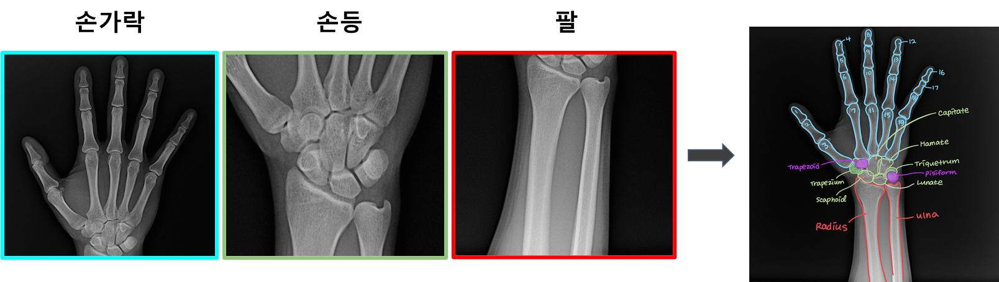

In [20]:
avg = df2['dice'].describe()
print('- dice describe ---------------')
print(avg)

- dice describe ---------------
count    160.000000
mean       0.951759
std        0.008641
min        0.857400
25%        0.949850
50%        0.952550
75%        0.955400
max        0.961800
Name: dice, dtype: float64


[0] name: DCM/ID363/image1664935962797.png, dice: 0.8574
- 점수가 낮은 클래스 ---------------
finger-14    0.3081
finger-1     0.4296
finger-10    0.6041
finger-13    0.7165
finger-17    0.7299
Capitate      0.791
finger-6      0.839
finger-2     0.8409
Trapezium    0.8686
Trapezoid    0.8694
Name: 84, dtype: object
- meta data --------------------
ID              363
나이               65
성별         _x0008_여
체중(몸무게)        56.0
키(신장)         150.0
Name: 362, dtype: object


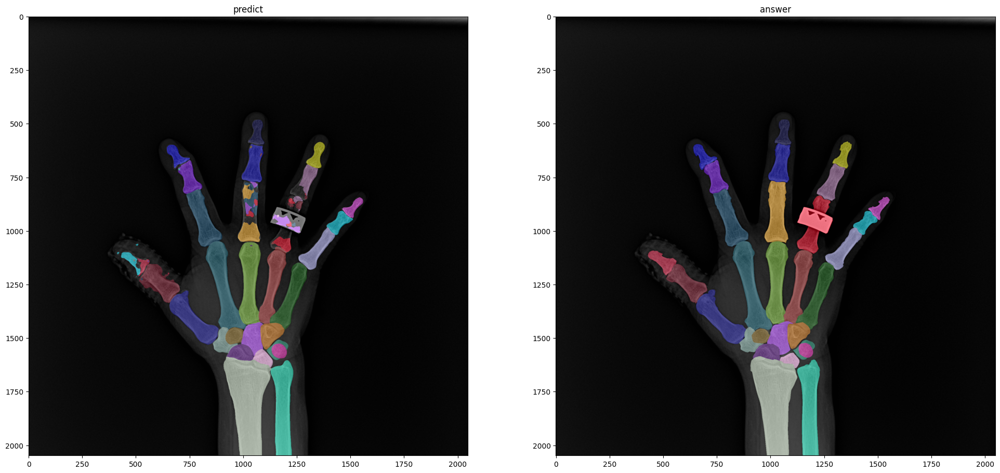

[1] name: DCM/ID373/image1665452035077.png, dice: 0.9397
- 점수가 낮은 클래스 ---------------
Pisiform      0.7961
Trapezoid     0.8603
Capitate      0.8851
Lunate        0.8919
Triquetrum    0.9031
finger-17     0.9119
Hamate        0.9201
finger-16     0.9268
Trapezium     0.9323
finger-15     0.9418
Name: 88, dtype: object
- meta data --------------------
ID              373
나이               24
성별         _x0008_남
체중(몸무게)        63.0
키(신장)         168.0
Name: 372, dtype: object


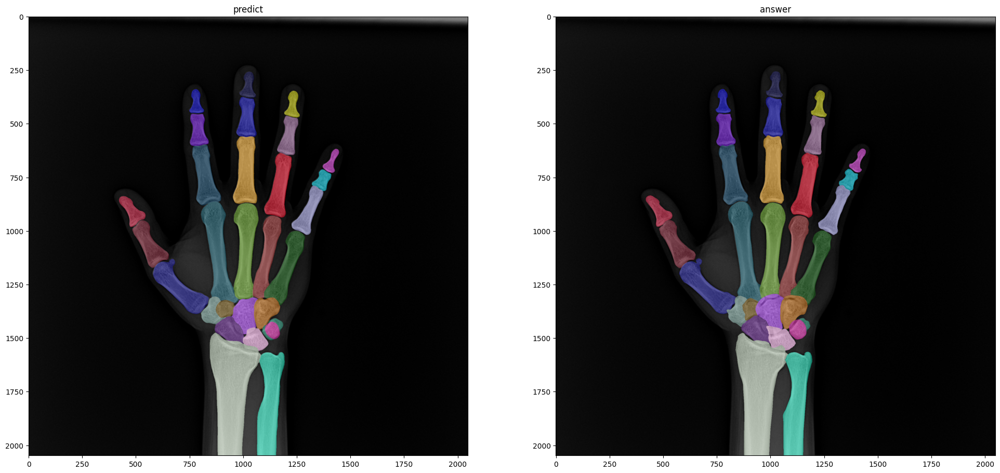

[2] name: DCM/ID328/image1664846856735.png, dice: 0.9398
- 점수가 낮은 클래스 ---------------
Pisiform       0.742
Triquetrum    0.8668
finger-1      0.9058
Trapezoid     0.9068
Trapezium     0.9131
finger-12     0.9272
finger-5       0.929
Hamate        0.9322
finger-4      0.9333
finger-8      0.9346
Name: 71, dtype: object
- meta data --------------------
ID              328
나이               43
성별         _x0008_여
체중(몸무게)        56.0
키(신장)         164.0
Name: 327, dtype: object


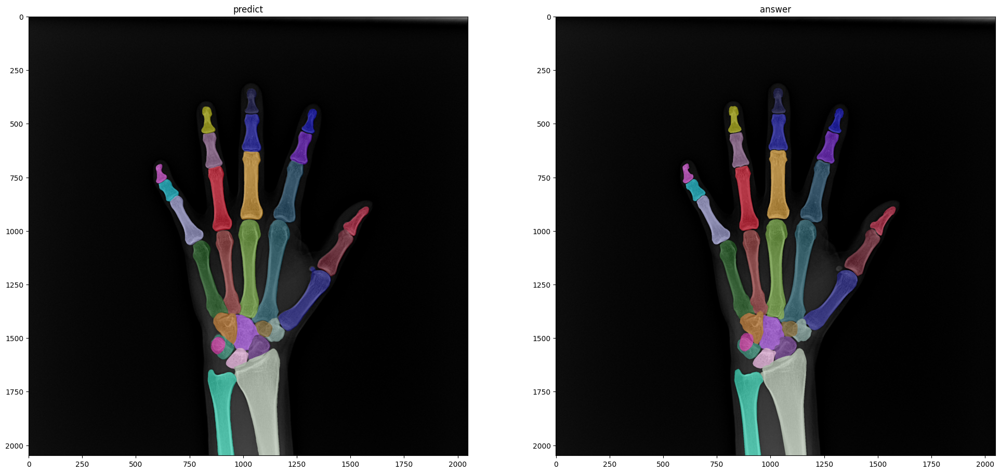

[3] name: DCM/ID538/image1667266231591.png, dice: 0.9409
- 점수가 낮은 클래스 ---------------
Pisiform      0.7798
Trapezoid     0.8326
Capitate      0.9032
finger-4      0.9071
finger-16     0.9083
Trapezium     0.9135
Triquetrum    0.9221
Hamate        0.9295
finger-1      0.9322
Lunate        0.9434
Name: 155, dtype: object
- meta data --------------------
ID              538
나이               22
성별         _x0008_여
체중(몸무게)        49.0
키(신장)         156.0
Name: 537, dtype: object


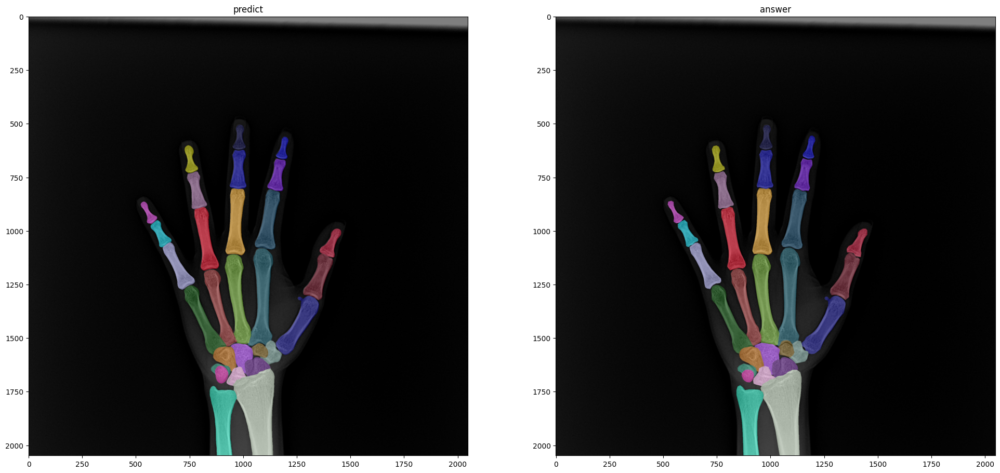

[4] name: DCM/ID024/image1661304319731.png, dice: 0.9412
- 점수가 낮은 클래스 ---------------
Pisiform      0.7695
Trapezoid     0.8444
Capitate      0.8772
Trapezium       0.91
Triquetrum    0.9182
finger-16     0.9334
finger-8      0.9358
finger-1      0.9365
finger-12     0.9385
finger-4      0.9386
Name: 9, dtype: object
- meta data --------------------
ID               24
나이               29
성별         _x0008_여
체중(몸무게)        42.0
키(신장)         158.0
Name: 23, dtype: object


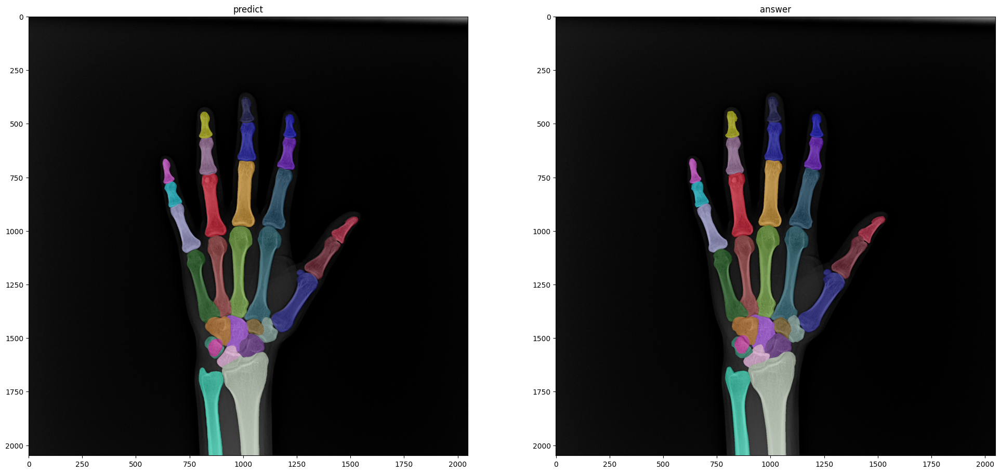

[5] name: DCM/ID060/image1661393400879.png, dice: 0.9422
- 점수가 낮은 클래스 ---------------
Pisiform      0.6842
Hamate        0.8119
Triquetrum    0.8659
Trapezoid     0.8764
Trapezium     0.9078
Scaphoid      0.9381
Lunate        0.9464
finger-8      0.9545
finger-17     0.9584
finger-1      0.9599
Name: 19, dtype: object
- meta data --------------------
ID               60
나이               37
성별         _x0008_남
체중(몸무게)        82.0
키(신장)         178.0
Name: 59, dtype: object


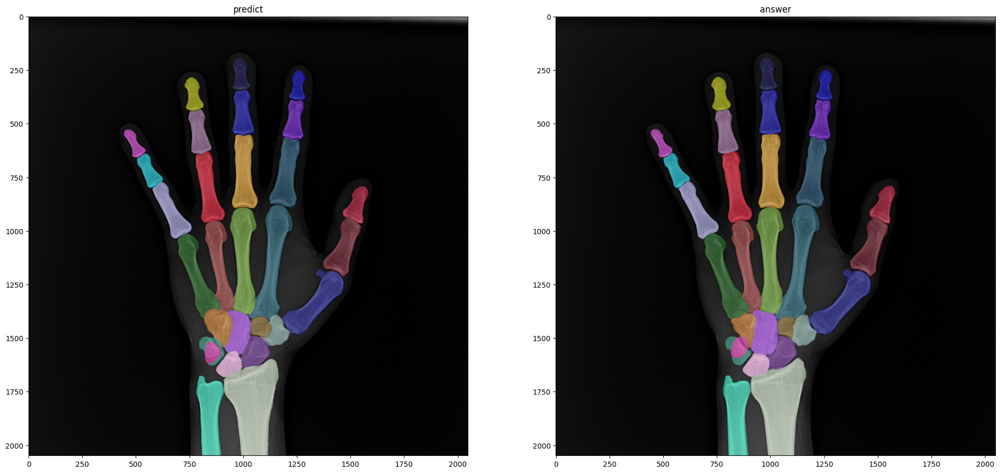

[6] name: DCM/ID111/image1661907834003.png, dice: 0.9426
- 점수가 낮은 클래스 ---------------
Pisiform      0.8312
Trapezoid     0.8632
Triquetrum    0.8838
Trapezium     0.8904
finger-16       0.92
finger-12     0.9287
finger-17      0.932
finger-4      0.9364
finger-13     0.9373
finger-5      0.9387
Name: 38, dtype: object
- meta data --------------------
ID              111
나이               30
성별         _x0008_여
체중(몸무게)        52.0
키(신장)         157.0
Name: 110, dtype: object


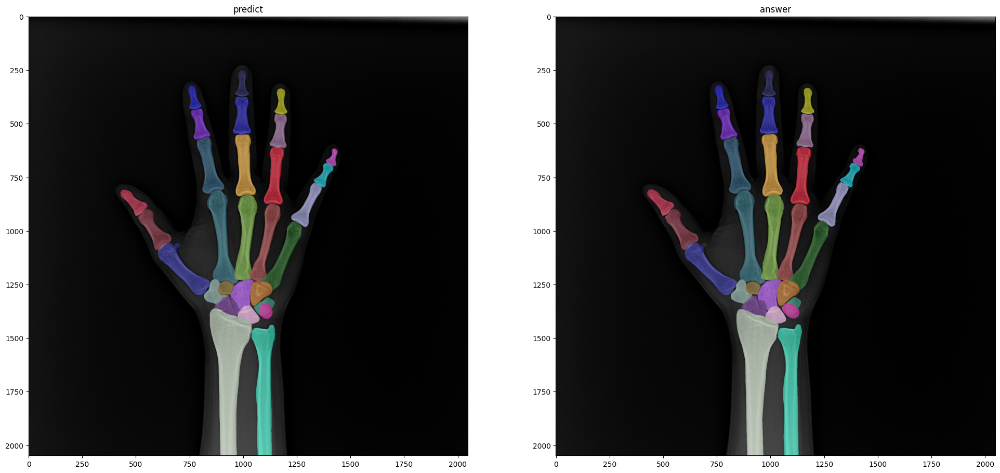

[7] name: DCM/ID328/image1664846838406.png, dice: 0.9446
- 점수가 낮은 클래스 ---------------
Pisiform     0.7856
Lunate       0.9091
Trapezoid    0.9129
finger-17    0.9162
Trapezium     0.931
Hamate       0.9333
finger-13    0.9352
finger-1     0.9365
finger-16    0.9371
finger-8     0.9379
Name: 70, dtype: object
- meta data --------------------
ID              328
나이               43
성별         _x0008_여
체중(몸무게)        56.0
키(신장)         164.0
Name: 327, dtype: object


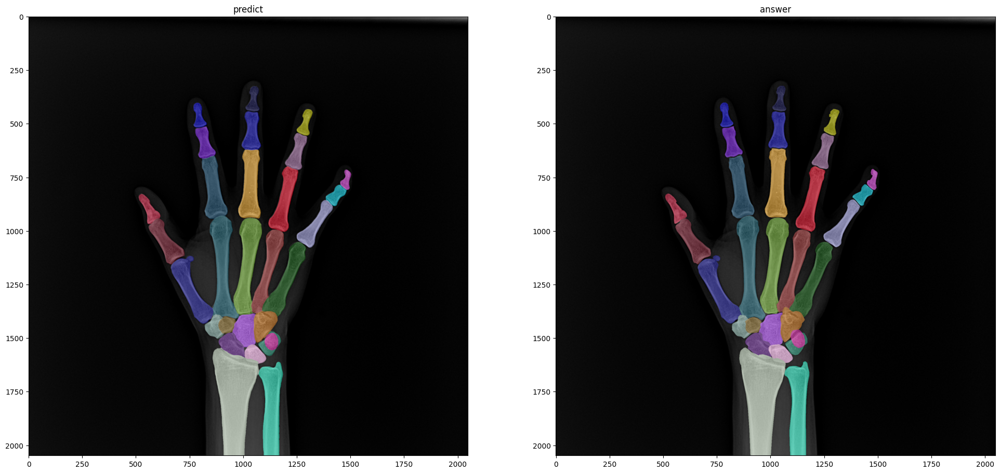

[8] name: DCM/ID080/image1661737404974.png, dice: 0.9447
- 점수가 낮은 클래스 ---------------
Pisiform      0.8226
Trapezoid     0.8532
Lunate        0.8812
Triquetrum    0.9027
Scaphoid      0.9099
Trapezium     0.9228
finger-4      0.9234
Capitate      0.9284
finger-16     0.9483
finger-1      0.9485
Name: 27, dtype: object
- meta data --------------------
ID               80
나이               38
성별         _x0008_남
체중(몸무게)        73.0
키(신장)         173.0
Name: 79, dtype: object


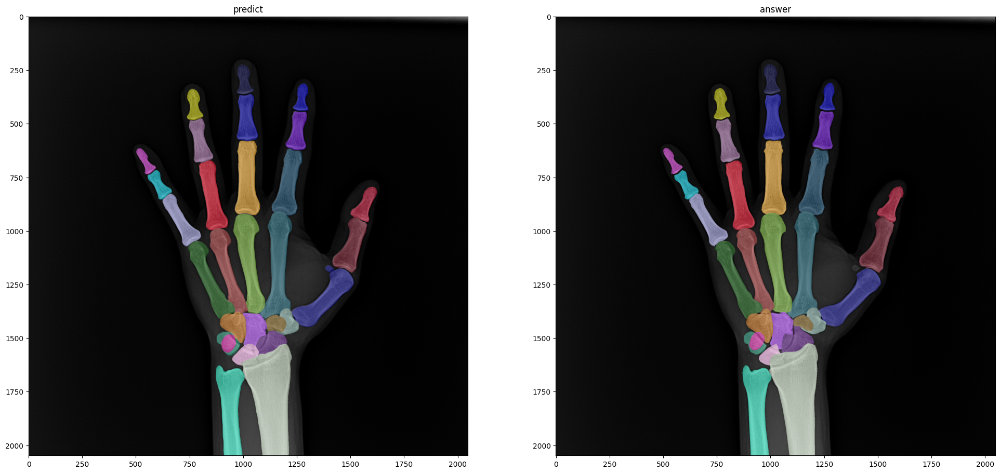

[9] name: DCM/ID468/image1666659863512.png, dice: 0.9449
- 점수가 낮은 클래스 ---------------
Trapezium    0.8752
Trapezoid    0.8975
Pisiform     0.9042
finger-17     0.909
finger-4      0.913
finger-12    0.9167
finger-16     0.922
finger-8     0.9318
finger-1     0.9341
Lunate       0.9497
Name: 126, dtype: object
- meta data --------------------
ID              468
나이               24
성별         _x0008_여
체중(몸무게)        53.0
키(신장)         158.0
Name: 467, dtype: object


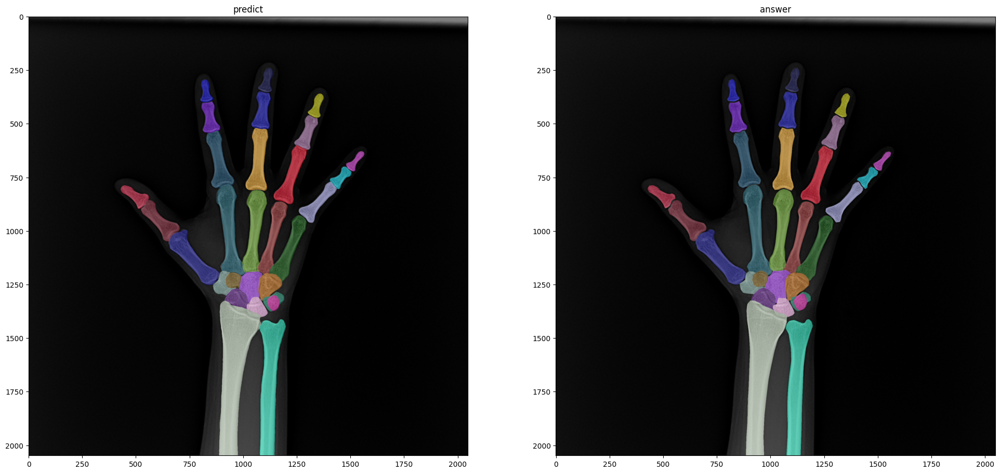

[10] name: DCM/ID468/image1666659890125.png, dice: 0.9449
- 점수가 낮은 클래스 ---------------
finger-1     0.8687
Pisiform     0.8933
finger-16    0.9129
finger-4     0.9249
Trapezoid    0.9311
finger-17    0.9315
Trapezium    0.9357
Lunate       0.9377
finger-8     0.9391
finger-9     0.9397
Name: 127, dtype: object
- meta data --------------------
ID              468
나이               24
성별         _x0008_여
체중(몸무게)        53.0
키(신장)         158.0
Name: 467, dtype: object


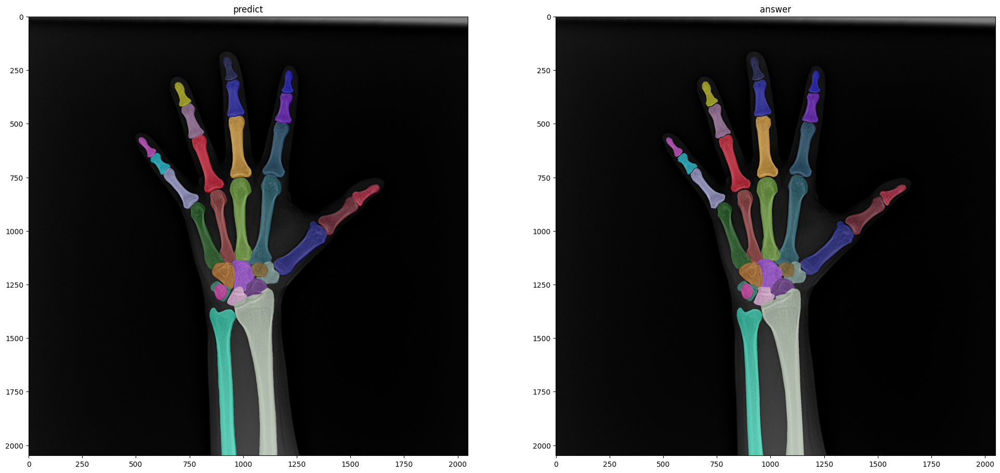

[11] name: DCM/ID293/image1664157316352.png, dice: 0.9451
- 점수가 낮은 클래스 ---------------
Pisiform      0.9015
finger-1      0.9076
Triquetrum    0.9177
finger-9      0.9271
Hamate        0.9272
finger-8      0.9309
finger-13     0.9321
finger-5      0.9325
Lunate         0.934
Trapezium     0.9366
Name: 56, dtype: object
- meta data --------------------
ID              293
나이               29
성별         _x0008_여
체중(몸무게)        53.0
키(신장)         160.0
Name: 292, dtype: object


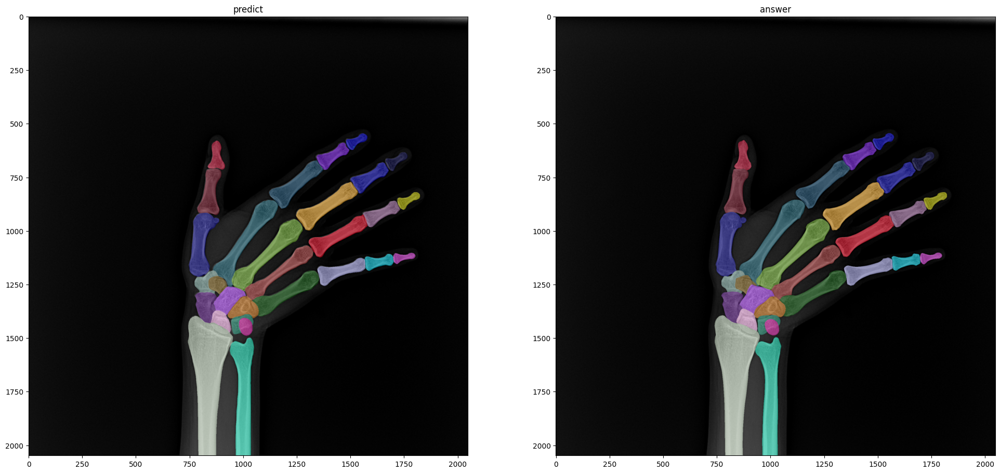

[12] name: DCM/ID034/image1661317775801.png, dice: 0.9453
- 점수가 낮은 클래스 ---------------
Triquetrum    0.8043
Trapezoid     0.8831
Pisiform      0.9103
finger-4      0.9118
Lunate        0.9228
Trapezium     0.9338
finger-17     0.9349
finger-5      0.9385
finger-12     0.9399
finger-16     0.9422
Name: 13, dtype: object
- meta data --------------------
ID               34
나이               24
성별         _x0008_여
체중(몸무게)        59.0
키(신장)         153.0
Name: 33, dtype: object


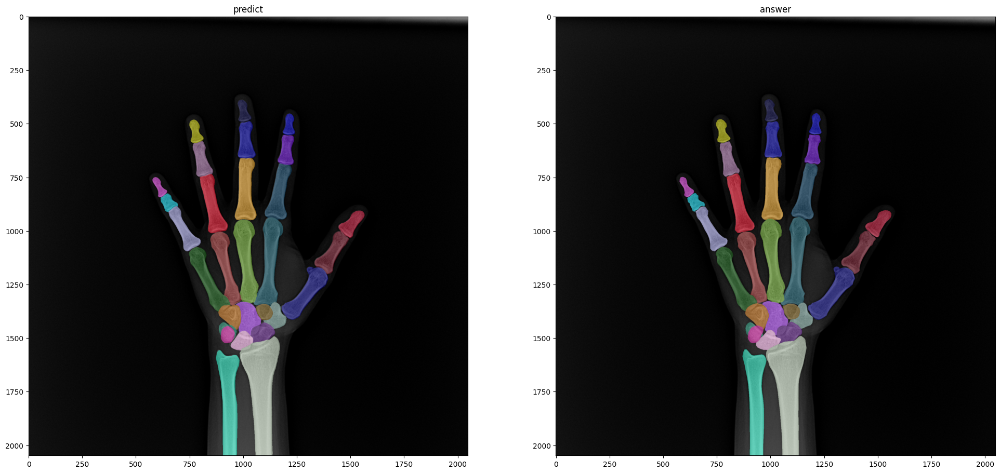

[13] name: DCM/ID136/image1662340433669.png, dice: 0.946
- 점수가 낮은 클래스 ---------------
Trapezoid     0.7943
Pisiform      0.8263
Trapezium      0.897
Hamate         0.905
finger-16     0.9274
finger-17     0.9359
Capitate      0.9379
finger-4      0.9481
Triquetrum    0.9505
finger-7      0.9511
Name: 48, dtype: object
- meta data --------------------
ID              136
나이               33
성별         _x0008_여
체중(몸무게)        59.0
키(신장)         163.0
Name: 135, dtype: object


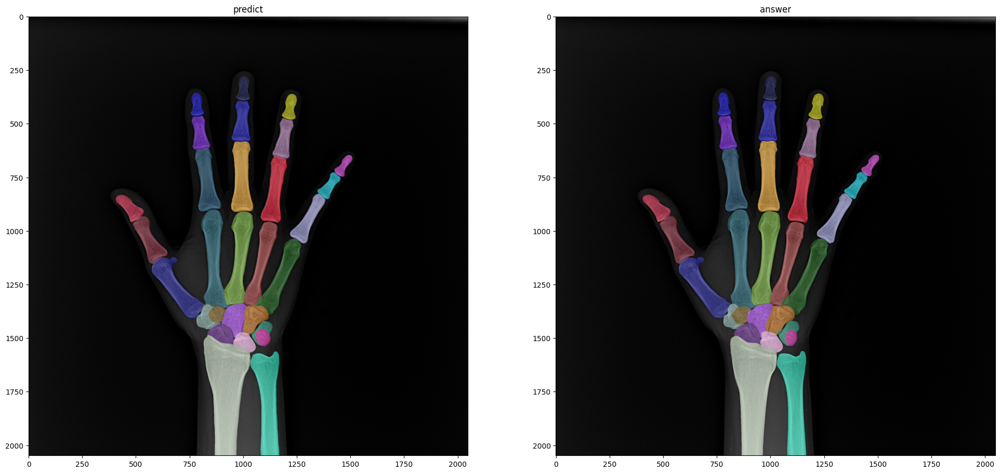

[14] name: DCM/ID538/image1667266190612.png, dice: 0.9464
- 점수가 낮은 클래스 ---------------
Trapezoid     0.8265
Pisiform      0.9031
Lunate        0.9142
finger-16     0.9229
Trapezium     0.9291
Hamate        0.9306
finger-12     0.9341
finger-4      0.9367
Triquetrum    0.9389
finger-17     0.9435
Name: 154, dtype: object
- meta data --------------------
ID              538
나이               22
성별         _x0008_여
체중(몸무게)        49.0
키(신장)         156.0
Name: 537, dtype: object


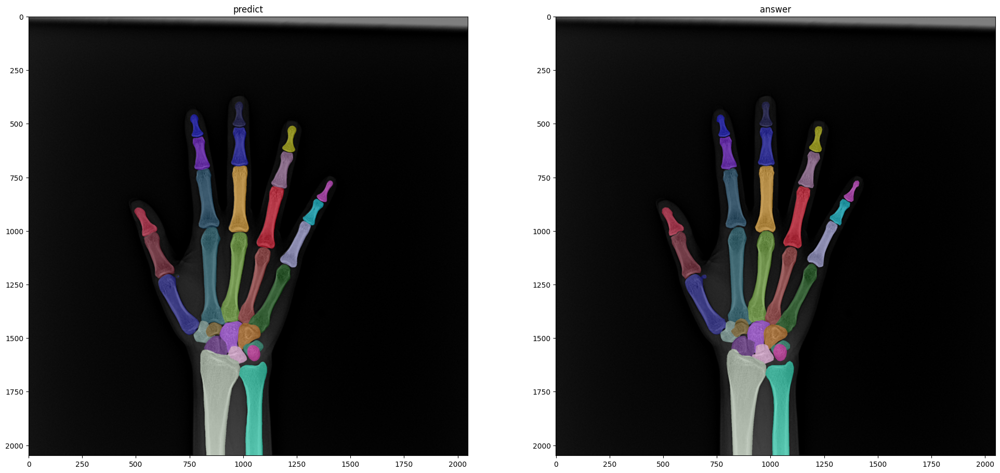

In [24]:

# head속에 확인할 갯수 적어주세요

for for_idx, (index, line) in enumerate((df2.head(15)).iterrows()):
    print(f"[{for_idx}] name: {line['file_name']}, dice: {line['dice']}")
    # print(line)
    dice_score_by_class = line['finger-1':'Ulna'].sort_values()
    print('- 점수가 낮은 클래스 ---------------')
    print(dice_score_by_class[:10])
    # print(line)
    
    print('- meta data --------------------')
    split_file_name = line['file_name'].split('/')
    id_index = int(split_file_name[1][2:])
    print(edf.iloc[id_index-1])

    image = cv2.imread(os.path.join(IMAGE_ROOT, line['file_name']))
    preds = []
    
    for rle in rles[index*29:index*29+29]:
        pred = decode_rle_to_mask(rle, height=2048, width=2048)
        preds.append(pred)
    
    preds = np.stack(preds, 0)
    fig, ax = plt.subplots(1, 2, figsize=(24, 12))
    ax[0].imshow(image)    # remove channel dimension
    ax[0].imshow(label2rgb(preds), alpha=0.5)
    ax[0].set_title('predict')
    # ax[1].imshow(label2rgb())
    _,label,_ = valid_dataset[index]
    ax[1].imshow(image)
    ax[1].imshow(label2rgb(label), alpha=0.5)
    ax[1].set_title('answer')
    
    plt.show()